In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, SpectralClustering
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_selector, make_column_transformer
from yellowbrick.cluster import (
    SilhouetteVisualizer,
    KElbowVisualizer,
    InterclusterDistance,
)
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.decomposition import PCA, KernelPCA
import plotly.express as px
from sklearn.manifold import TSNE
from data_analysis_library import *

pd.set_option("display.max_columns", 40)

In [2]:
data = pd.read_pickle("rfm_data.pkl")
df_merged = pd.read_pickle("merged_data.pkl")

In [3]:
data = data.set_index("customer_unique_id")
rfm = data.copy()
rfm = rfm.drop("mean_review_score", axis=1)

### Manipulation des données

In [4]:
rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 94457 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   recency         94457 non-null  int32  
 1   frequency       94457 non-null  int64  
 2   monetary_value  94457 non-null  float64
dtypes: float64(1), int32(1), int64(1)
memory usage: 2.5+ MB


In [5]:
display(rfm)

,recency,frequency,monetary_value
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,116,1,7236.90
0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1631.40
0000f46a3911fa3c0805444483337064,542,1,6725.16
0000f6ccb0745a6a4b88665a16c9f078,326,1,1221.36
0004aac84e0df4da2b147fca70cf8255,293,1,20082.78
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,452,1,33078.72
fffea47cd6d3cc0a88bd621562a9d061,267,1,4651.90
ffff371b4d645b6ecea244b27531430a,573,1,5847.92


### K_Means

In [6]:
scaler = MinMaxScaler()
preprocessor = ColumnTransformer(
    [("scaler", scaler, make_column_selector(dtype_include=np.number))]
)

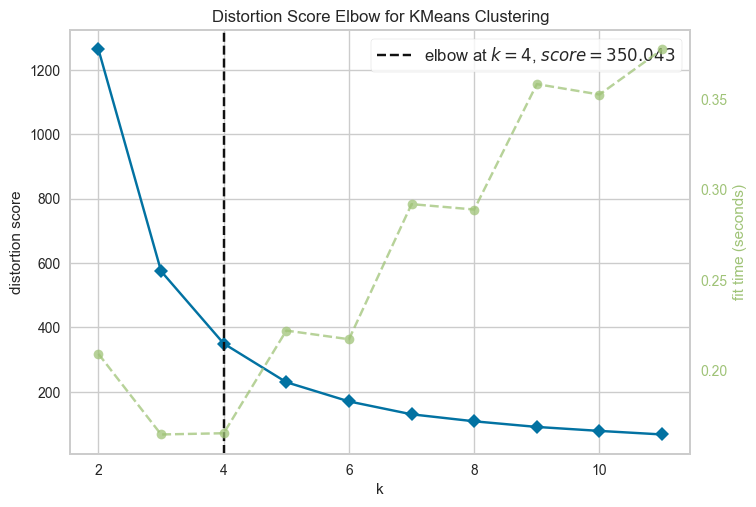

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [7]:
kmeans_visualizer = Pipeline(
    [
        ("preprocessor", preprocessor),
        (
            "kelbowvisualizer",
            KElbowVisualizer(KMeans(n_init=10, random_state=0), k=(2, 12)),
        ),
    ]
)
kmeans_visualizer.fit(rfm)
kmeans_visualizer.named_steps["kelbowvisualizer"].show()

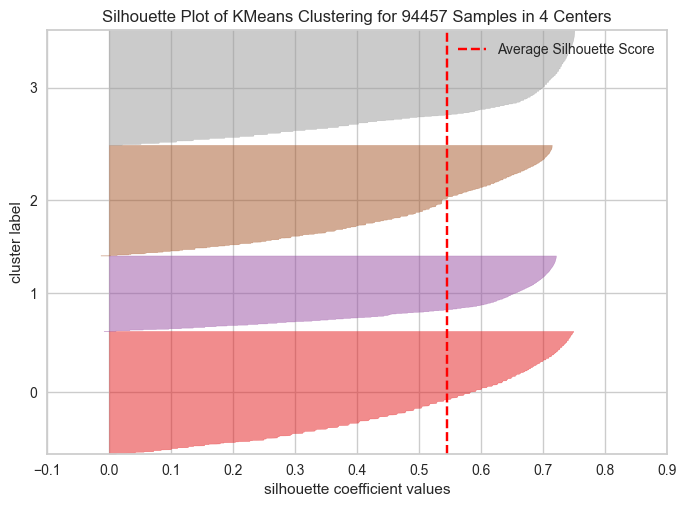

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 94457 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [8]:
K = kmeans_visualizer.named_steps["kelbowvisualizer"].elbow_value_
silhouette_visualizer = Pipeline(
    [
        ("preprocessor", preprocessor),
        (
            "silhouettevisualizer",
            SilhouetteVisualizer(KMeans(K, n_init=10, random_state=0)),
        ),
    ]
)
silhouette_visualizer.fit(rfm)
silhouette_visualizer.named_steps["silhouettevisualizer"].show()

C:\Users\aurel\anaconda3\envs\env_P5\Lib\site-packages\sklearn\manifold\_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


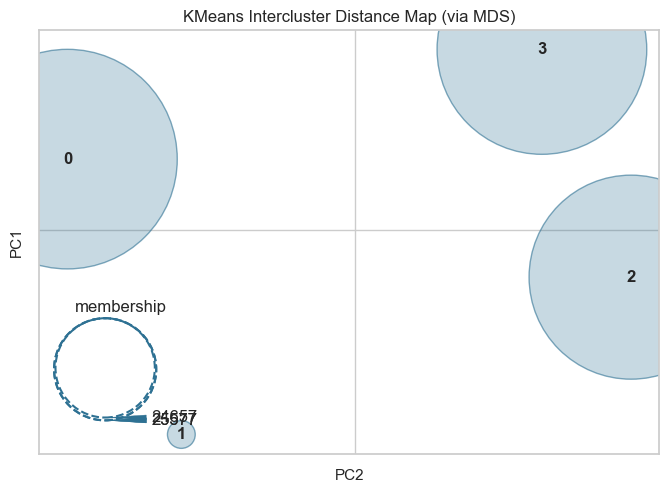

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [9]:
distance_visualizer = Pipeline(
    [
        ("preprocessor", preprocessor),
        (
            "distancevisualizer",
            InterclusterDistance(KMeans(K, n_init=10, random_state=0)),
        ),
    ]
)
distance_visualizer.fit(rfm)
distance_visualizer.named_steps["distancevisualizer"].show()

In [10]:
rfm_scaled = preprocessor.fit_transform(rfm)
kmeans_model = Pipeline(
    [("preprocessor", preprocessor), ("kmeans", KMeans(K, n_init=10, random_state=0))]
)
kmeans_model.fit(rfm)
rfm_kmeans_labels = kmeans_model.named_steps["kmeans"].labels_
db = davies_bouldin_score(rfm_scaled, rfm_kmeans_labels)
sil = silhouette_score(rfm_scaled, rfm_kmeans_labels)
print(f"Indice de Davies-Bouldin : {db} \nIndice de silhouette : {sil}")

rfm["kmeans_label"] = rfm_kmeans_labels
cluster_data = {}
for label in set(rfm_kmeans_labels):
    cluster_data[label] = rfm[rfm_kmeans_labels == label]

Indice de Davies-Bouldin : 0.5344515037863024 
Indice de silhouette : 0.5452621729630365


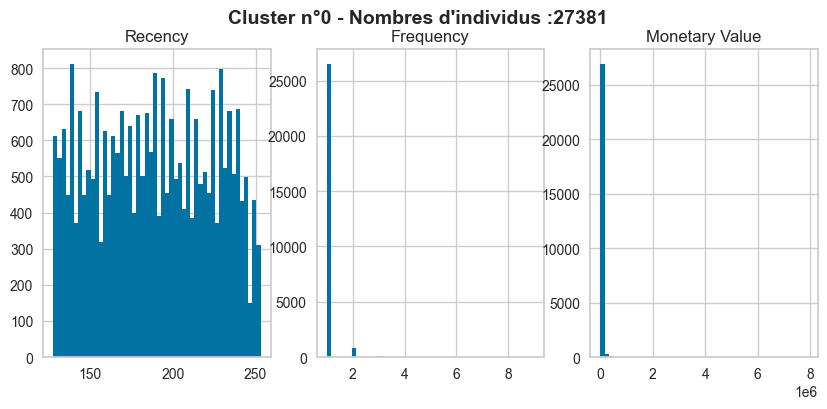

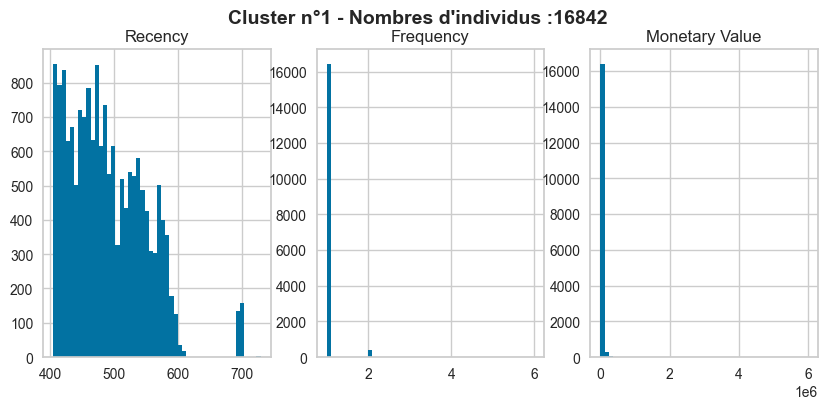

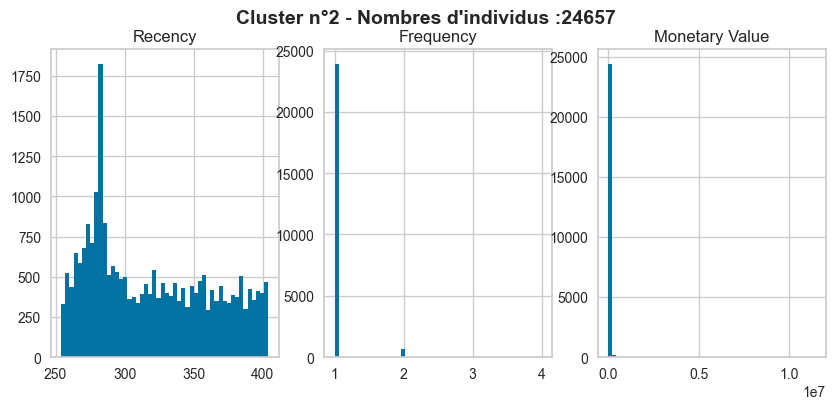

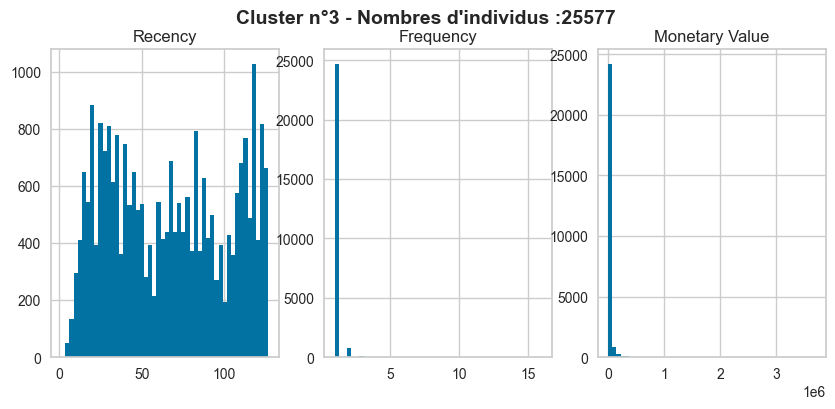

In [11]:
def plot_histograms(cluster_data):
    for i in range(len(cluster_data)):
        # créer un sous-tracé pour chaque variable
        fig, axs = plt.subplots(1, 3, figsize=(10, 4))

        # tracer l'histogramme pour chaque variable
        axs[0].hist(cluster_data[i]["recency"], bins=50)
        axs[1].hist(cluster_data[i]["frequency"], bins=50)
        axs[2].hist(cluster_data[i]["monetary_value"], bins=50)

        # ajouter des titres et des étiquettes d'axes

        axs[0].set_title("Recency")
        axs[1].set_title("Frequency")
        axs[2].set_title("Monetary Value")
        fig.suptitle(
            f"Cluster n°{str(i)} - Nombres d'individus :{cluster_data[i].shape[0]}",
            fontsize=14,
            fontweight="bold",
        )
        plt.show()


plot_histograms(cluster_data)

In [12]:
def print_mean(cluster_data):
    for i in range(len(cluster_data)):
        print(f"Cluster n°{str(i)} - Nombres d'individus :{cluster_data[i].shape[0]}")
        print(f"Moyenne des features: \n{cluster_data[i].mean()}")
        print("-" * 30)


print_mean(cluster_data)

Cluster n°0 - Nombres d'individus :27381
Moyenne des features: 
recency             188.472627
frequency             1.035390
monetary_value    21913.097983
kmeans_label          0.000000
dtype: float64
------------------------------
Cluster n°1 - Nombres d'individus :16842
Moyenne des features: 
recency             489.818252
frequency             1.025591
monetary_value    21575.892224
kmeans_label          1.000000
dtype: float64
------------------------------
Cluster n°2 - Nombres d'individus :24657
Moyenne des features: 
recency             319.356613
frequency             1.031999
monetary_value    23630.130563
kmeans_label          2.000000
dtype: float64
------------------------------
Cluster n°3 - Nombres d'individus :25577
Moyenne des features: 
recency              66.963014
frequency             1.038980
monetary_value    22458.463338
kmeans_label          3.000000
dtype: float64
------------------------------


**Remarque** :
On remarque que la segmentation s'est effectuée principalement sur la variable Récence.
- Cluster 0 : Clients peu récents
- Cluster 1 : Clients anciens
- Cluster 2 : Clients assez récents
- Cluster 3 : Clients très récents

In [13]:
rfm["kmeans_label"].replace(
    {
        0: "Récence : [125-250]",
        1: "Récence : [400-700]",
        2: "Récence : [250-400]",
        3: "Récence : [0-125]",
    },
    inplace=True,
)
fig = px.scatter_3d(
    rfm,
    x="recency",
    y="frequency",
    z="monetary_value",
    color="kmeans_label",
    opacity=0.6,
    title="Visualisation 3D - Clusterisation RFM",
)
fig.show()

## Ajout de nouvelles features :
-mean_review_score : Note moyenne des clients.  
-mean_delivery_time: Temps de livraison moyen (en jours)   
-total_items : Nombre total de produits commandés.  
-freight_ratio : Pourcentage de frais  de port dans le prix total payé par le client

In [14]:
df_merged["delivery_time"] = (
    pd.to_datetime(df_merged["order_delivered_customer_date"])
    - pd.to_datetime(df_merged["order_purchase_timestamp"])
).dt.days

var_to_merge = df_merged.groupby("customer_unique_id").agg(
    {
        "delivery_time": lambda x: x.mean(),
        "freight_value": lambda x: x.sum(),
        "price": lambda x: x.sum(),
        "product_id": lambda x: x.nunique(),
        "review_score": lambda x:mean()
    }
)
var_to_merge.rename(
    columns={"product_id": "total_items", "delivery_time": "mean_delivery_time", "review_score" : "mean_review_score"},
    inplace=True,
)
var_to_merge["freight_ratio"] = var_to_merge["freight_value"] / var_to_merge["price"]
var_to_merge.drop(["freight_value", "price"], axis=1, inplace=True)
df = data.merge(var_to_merge, how="left", on="customer_unique_id")

In [15]:
display(df.isna().mean())
df = df.fillna(0)

recency               0.000000
frequency             0.000000
monetary_value        0.000000
mean_review_score     0.000000
mean_delivery_time    0.020729
total_items           0.000000
freight_ratio         0.000000
dtype: float64

### Méthode du coude

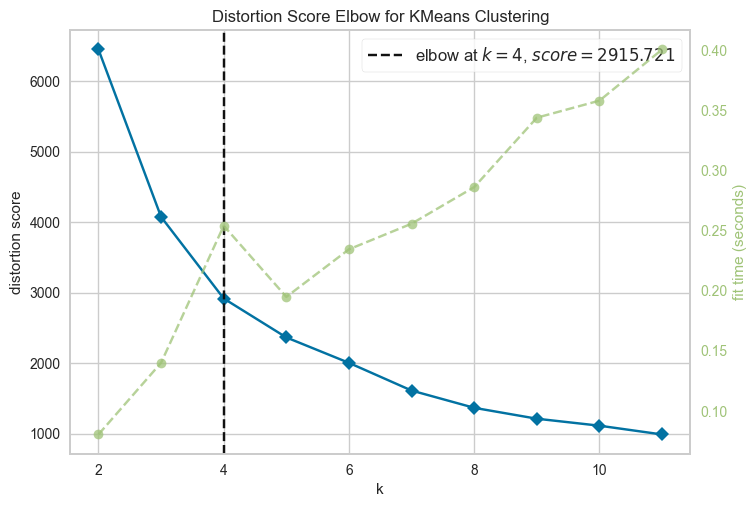

In [16]:
kmeans_visualizer = Pipeline(
    [
        ("preprocessor", preprocessor),
        (
            "kelbowvisualizer",
            KElbowVisualizer(KMeans(n_init=10, random_state=0), k=(2, 12)),
        ),
    ]
)
kmeans_visualizer.fit(df)
kmeans_visualizer.named_steps["kelbowvisualizer"].show()
K = kmeans_visualizer.named_steps["kelbowvisualizer"].elbow_value_

### Silhouette et calinski_harabasz

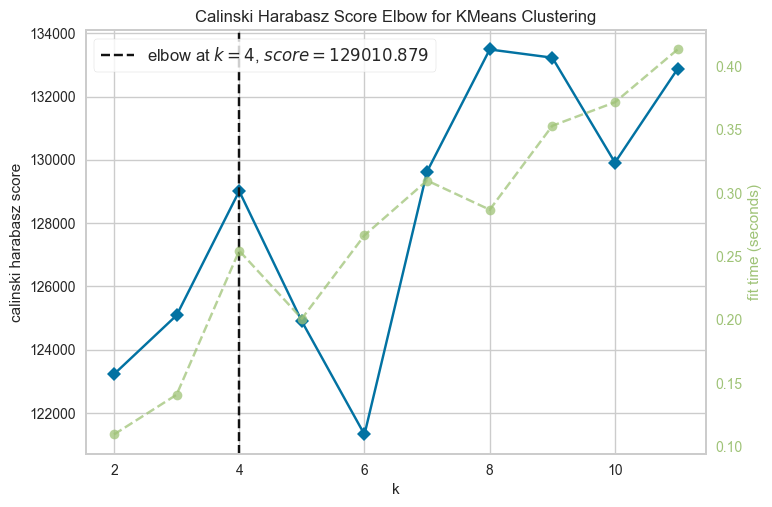

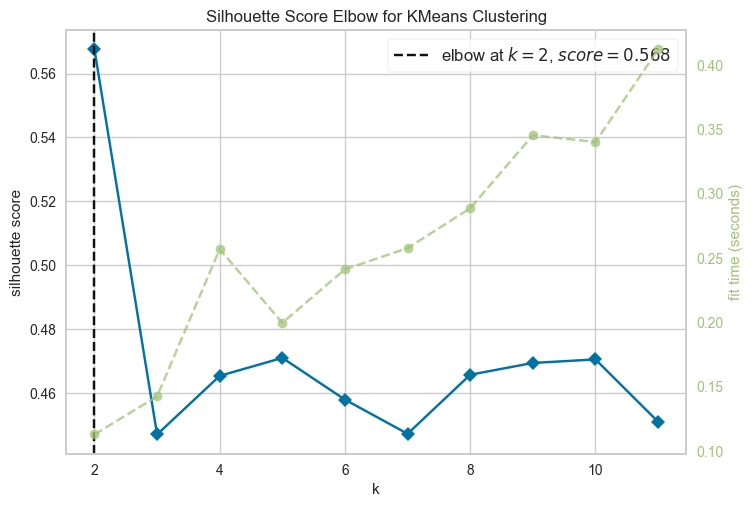

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [17]:
kmeans_visualizer = Pipeline(
    [
        ("preprocessor", preprocessor),
        (
            "kelbowvisualizer",
            KElbowVisualizer(
                KMeans(n_init=10, random_state=0), k=(2, 12), metric="calinski_harabasz"
            ),
        ),
    ]
)
kmeans_visualizer.fit(df)
kmeans_visualizer.named_steps["kelbowvisualizer"].show()
kmeans_visualizer = Pipeline(
    [
        ("preprocessor", preprocessor),
        (
            "kelbowvisualizer",
            KElbowVisualizer(
                KMeans(n_init=10, random_state=0), k=(2, 12), metric="silhouette"
            ),
        ),
    ]
)
kmeans_visualizer.fit(df)
kmeans_visualizer.named_steps["kelbowvisualizer"].show()

### Silhouette Plot

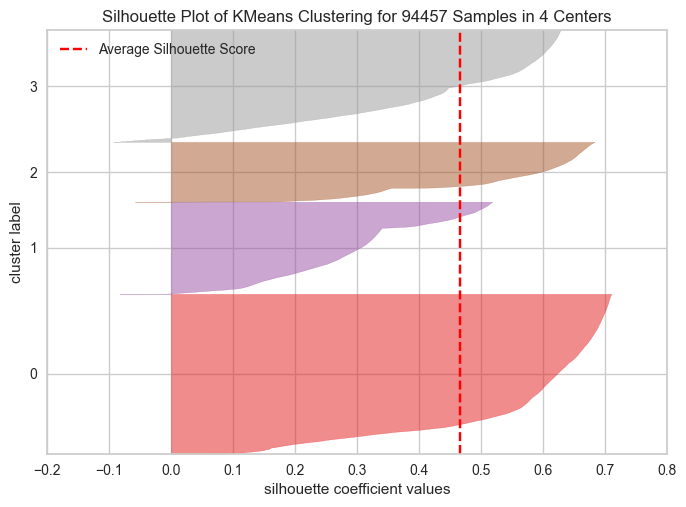

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 94457 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [18]:
silhouette_visualizer = Pipeline(
    [
        ("preprocessor", preprocessor),
        (
            "silhouettevisualizer",
            SilhouetteVisualizer(KMeans(K, n_init=10, random_state=0)),
        ),
    ]
)
silhouette_visualizer.fit(df)
silhouette_visualizer.named_steps["silhouettevisualizer"].show()

C:\Users\aurel\anaconda3\envs\env_P5\Lib\site-packages\sklearn\manifold\_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



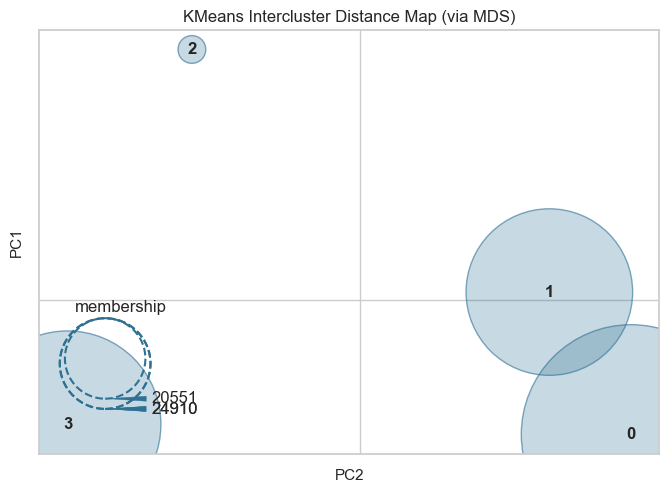

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [19]:
distance_visualizer = Pipeline(
    [
        ("preprocessor", preprocessor),
        (
            "distancevisualizer",
            InterclusterDistance(KMeans(K, n_init=10, random_state=0)),
        ),
    ]
)
distance_visualizer.fit(df)
distance_visualizer.named_steps["distancevisualizer"].show()

In [20]:
df_scaled = preprocessor.fit_transform(df)
kmeans_model = Pipeline(
    [("preprocessor", preprocessor), ("kmeans", KMeans(K, n_init=10, random_state=0))]
)
kmeans_model.fit(df)
kmeans_labels = kmeans_model.named_steps["kmeans"].labels_
db = davies_bouldin_score(df_scaled, kmeans_labels)
sil = silhouette_score(df_scaled, kmeans_labels)
print(f"Indice de Davies-Bouldin : {db} \nIndice de silhouette : {sil}")

cluster_data = {}
for label in set(kmeans_labels):
    cluster_data[label] = df[kmeans_labels == label]

Indice de Davies-Bouldin : 0.7954440678738464 
Indice de silhouette : 0.4653688253037719


In [21]:
print_mean(cluster_data)

Cluster n°0 - Nombres d'individus :35658
Moyenne des features: 
recency                 144.762914
frequency                 1.037663
monetary_value        20240.225562
mean_review_score         4.996771
mean_delivery_time       10.015864
total_items               1.059510
freight_ratio             0.300571
dtype: float64
------------------------------
Cluster n°1 - Nombres d'individus :20551
Moyenne des features: 
recency                 188.411026
frequency                 1.039706
monetary_value        21337.125003
mean_review_score         3.644662
mean_delivery_time       12.364264
total_items               1.070994
freight_ratio             0.314342
dtype: float64
------------------------------
Cluster n°2 - Nombres d'individus :13338
Moyenne des features: 
recency                 247.482531
frequency                 1.022942
monetary_value        33188.214850
mean_review_score         1.229687
mean_delivery_time       17.514907
total_items               1.114035
freight_ratio   

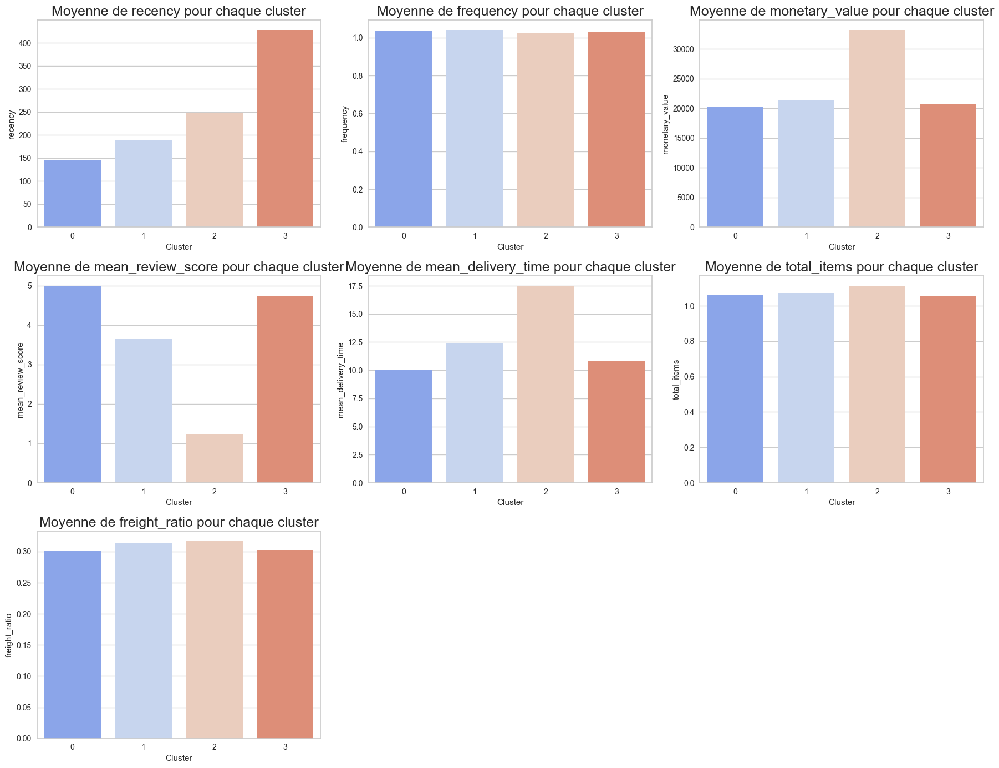

In [22]:
n_features = len(df.columns)
nrows = int(np.ceil(n_features / 3))
ncols = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 14))

for i, column in enumerate(df.columns):
    try:
        title = "Moyenne de " + str(column) + " pour chaque cluster"
        data = [cluster_data[label][column].mean() for label in cluster_data.keys()]
        sns.barplot(x=list(cluster_data.keys()), y=data, ax=axs[i // 3, i % 3], palette="coolwarm")
        axs[i // 3, i % 3].set_title(title, fontsize=18)
        axs[i // 3, i % 3].set_xlabel("Cluster")
        axs[i // 3, i % 3].set_ylabel(column)
    except Exception as e:
        print(f"Erreur pour la colonne '{column}': {e}")

# Remove empty subplots
for i in range(n_features, nrows * ncols):
    fig.delaxes(axs[i // 3, i % 3])

plt.tight_layout()
plt.show()

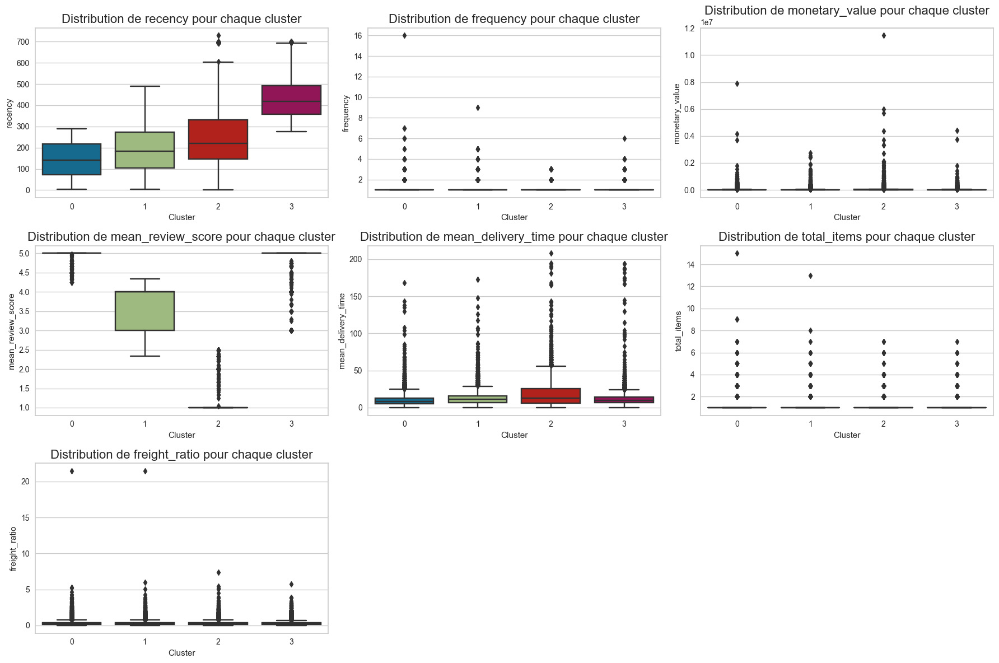

In [23]:
n_features = len(df.columns)
nrows = int(np.ceil(n_features / 3))
ncols = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 12))

for i, column in enumerate(df.columns):
    try:
        title = "Distribution de " + str(column) + " pour chaque cluster"
        data = [cluster_data[label][column].values for label in cluster_data.keys()]
        sns.boxplot(data=data, ax=axs[i // 3, i % 3])
        axs[i // 3, i % 3].set_title(title, fontsize=16)  # Corrected font size here
        axs[i // 3, i % 3].set_xlabel("Cluster")
        axs[i // 3, i % 3].set_ylabel(column)
    except Exception as e:  # Catch exceptions and print a more informative message
        print(f"Erreur pour la colonne '{column}': {e}")

for i in range(n_features, nrows * ncols):
    fig.delaxes(axs[i // 3, i % 3])

plt.tight_layout()
plt.show()

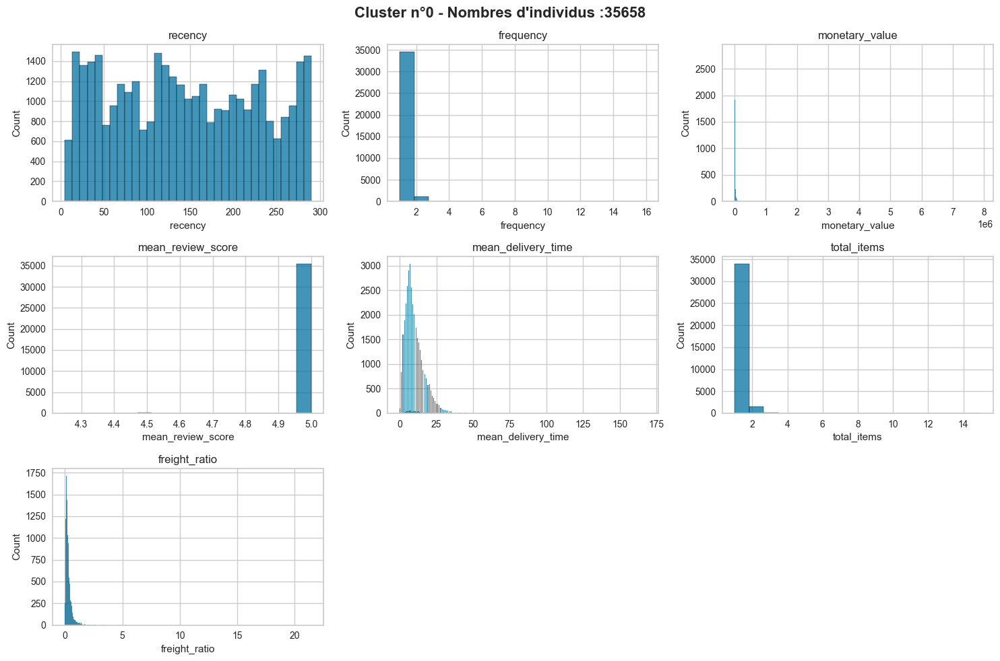

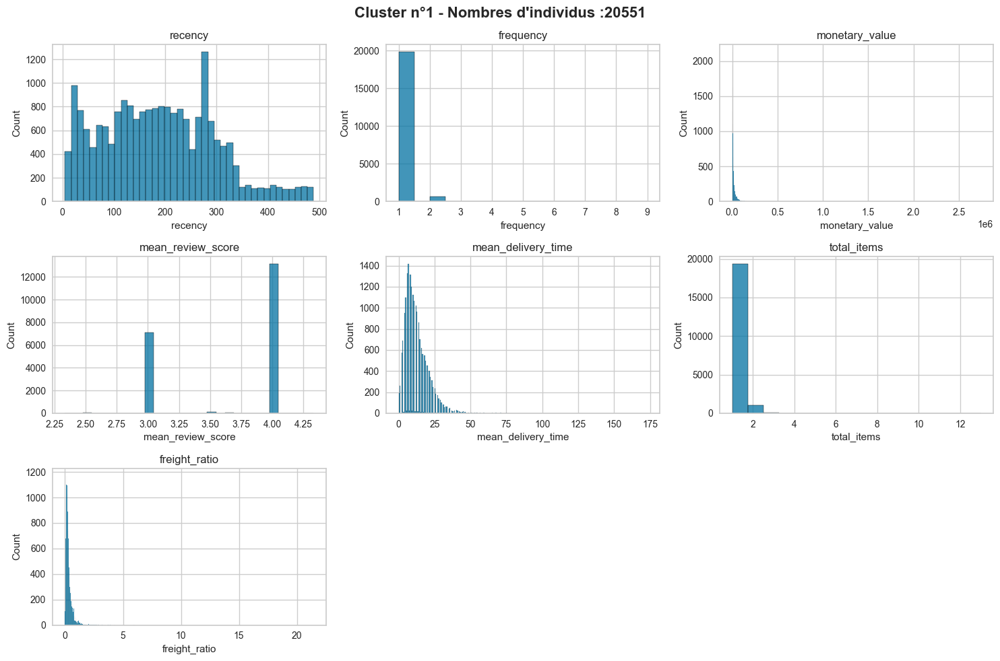

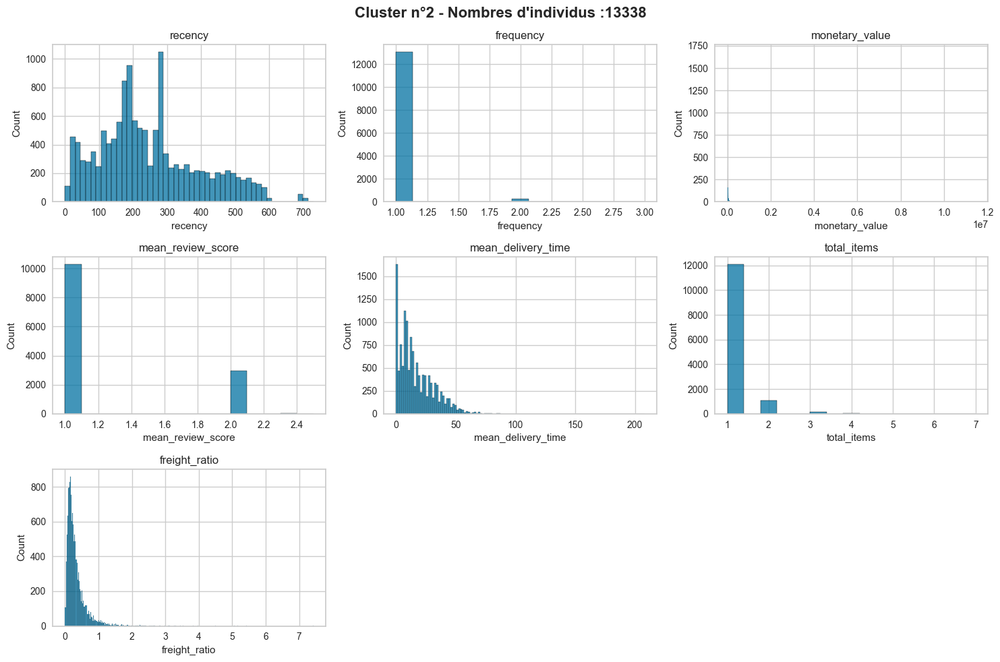

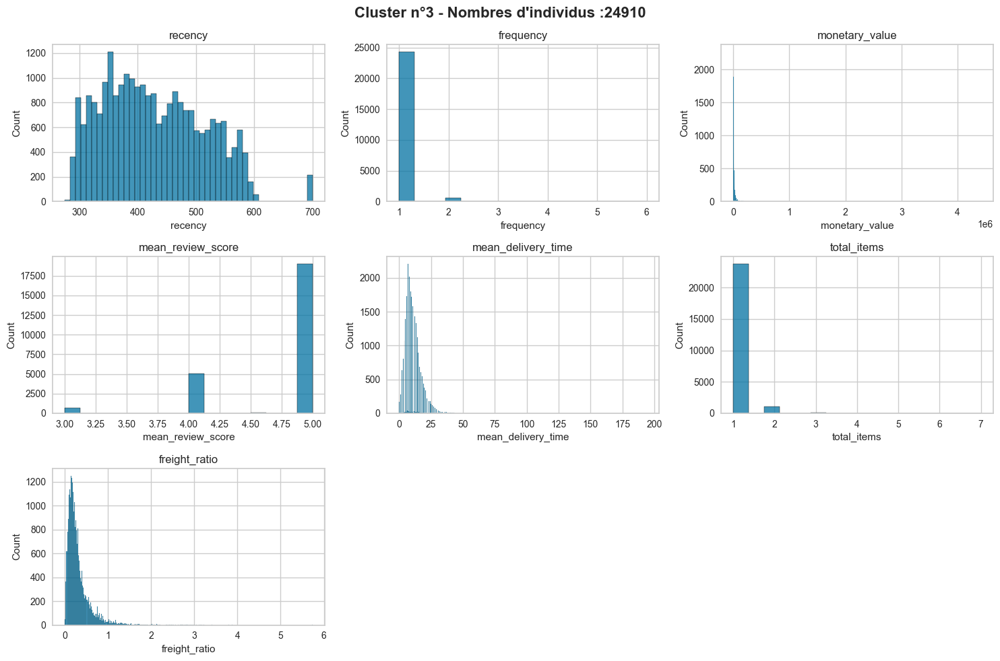

In [24]:
def plot_cluster_features(cluster_data, cluster_number):
    data = cluster_data[cluster_number]
    plt.figure(figsize=(15, 10))

    # Afficher les boxplots pour chaque colonne
    for i, column in enumerate(data.columns, 1):
        plt.subplot(3, 3, i)
        sns.histplot(data[column])
        plt.title(column)

    plt.suptitle(
        f"Cluster n°{str(cluster_number)} - Nombres d'individus :{cluster_data[cluster_number].shape[0]}",
        fontsize=16,
        fontweight="bold",
    )
    plt.tight_layout()
    plt.show()

for key in cluster_data.keys():
    plot_cluster_features(cluster_data, key)

In [25]:
X_scaled = preprocessor.fit_transform(df)
X_scaled = pd.DataFrame(X_scaled, index=df.index, columns=df.columns)
X_scaled["kmeans_label"] = kmeans_labels
X_scaled_clusters = X_scaled.groupby("kmeans_label").mean()
X_scaled_clusters

,recency,frequency,monetary_value,mean_review_score,mean_delivery_time,total_items,freight_ratio
kmeans_label,,,,,,,
0,0.197477,0.002511,0.001764,0.999193,0.048153,0.004251,0.014015
1,0.257433,0.002647,0.001860,0.661165,0.059444,0.005071,0.014657
2,0.338575,0.001529,0.002894,0.057422,0.084206,0.008145,0.014756
3,0.586582,0.001930,0.001811,0.934400,0.052103,0.003894,0.014083


In [26]:
import plotly.graph_objs as go


def plot_radars(data, group):
    scaler = MinMaxScaler()
    data = pd.DataFrame(
        scaler.fit_transform(data), index=data.index, columns=data.columns
    ).reset_index()

    fig = go.Figure()

    for k in data[group]:
        fig.add_trace(
            go.Scatterpolar(
                r=data[data[group] == k].iloc[:, 1:].values.reshape(-1),
                theta=data.columns[1:],
                fill="toself",
                name="Cluster " + str(k),
            )
        )

    fig.update_layout(
        polar=dict(radialaxis=dict(visible=True, range=[0, 1])),
        showlegend=True,
        title={
            "text": "Comparaison des moyennes par variable des clusters",
            "y": 0.95,
            "x": 0.5,
            "xanchor": "center",
            "yanchor": "top",
        },
        title_font_color="blue",
        title_font_size=18,
    )

    fig.show()


plot_radars(data=X_scaled_clusters, group="kmeans_label")

### PCA

In [27]:
df

,recency,frequency,monetary_value,mean_review_score,mean_delivery_time,total_items,freight_ratio
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,116,1,7236.90,5.0,6.0,1,0.092379
0000b849f77a49e4a4ce2b2a4ca5be3f,119,1,1631.40,4.0,3.0,1,0.438624
0000f46a3911fa3c0805444483337064,542,1,6725.16,3.0,25.0,1,0.249565
0000f6ccb0745a6a4b88665a16c9f078,326,1,1221.36,4.0,20.0,1,0.678338
0004aac84e0df4da2b147fca70cf8255,293,1,20082.78,5.0,13.0,1,0.093833
...,...,...,...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,452,1,33078.72,5.0,27.0,2,0.316828
fffea47cd6d3cc0a88bd621562a9d061,267,1,4651.90,4.0,30.0,1,0.303437
ffff371b4d645b6ecea244b27531430a,573,1,5847.92,5.0,14.0,1,0.250945


In [28]:
n_components = df.shape[1]
pca = Pipeline([("preprocessor", preprocessor), ("pca", PCA(svd_solver="full"))])
pca.fit(df)
X_projected = pca.fit_transform(df)
scree = pca.named_steps["pca"].explained_variance_ratio_ * 100

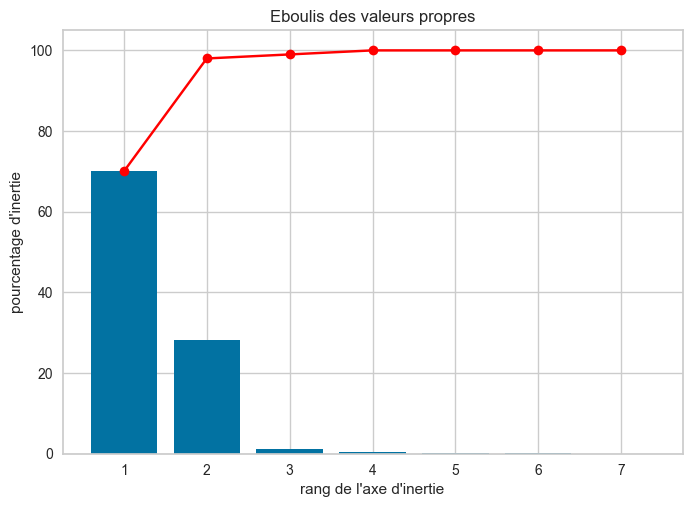

In [29]:
scree_cum = scree.cumsum().round()
scree_cum
x_list = range(1, n_components + 1)
list(x_list)
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum, c="red", marker="o")
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres")
plt.show(block=False)

Il faut conserver 3 composantes pour conserver la quasi totalité de la variance de notre jeu de données.

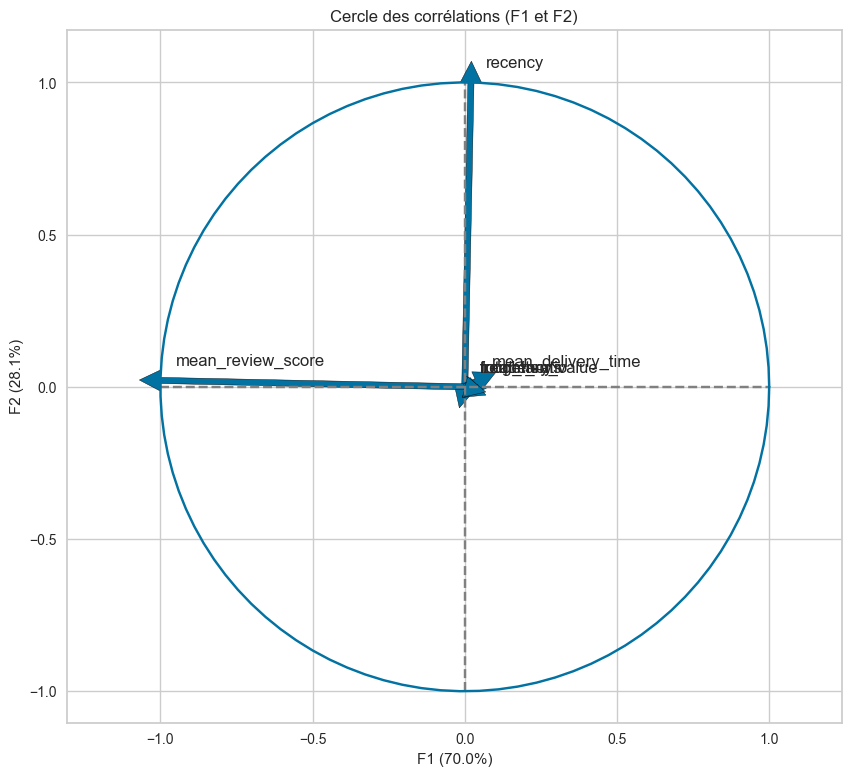

In [30]:
x_y = (0, 1)
correlation_graph(pca.named_steps["pca"], x_y, df.columns)

<!-- ### ACP avec Noyaux -->

In [31]:
df_pca = pd.DataFrame(X_projected[:, :2], index=df.index, columns=["F1", "F2"])

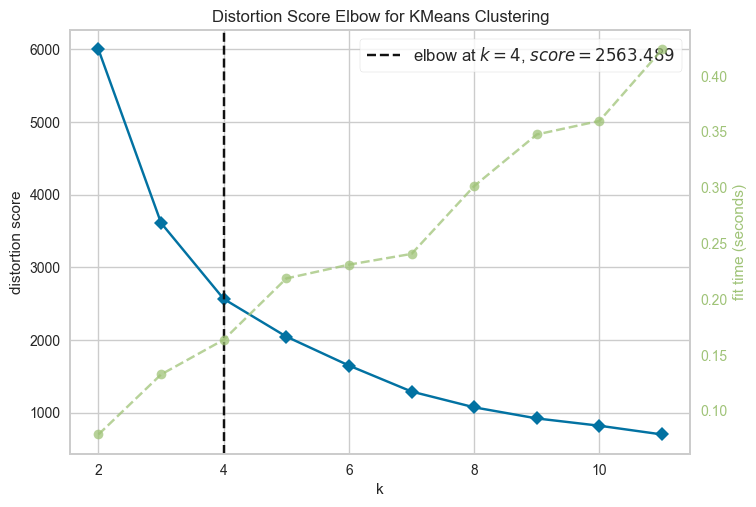

In [32]:
kmeans_visualizer = Pipeline(
    [
        ("preprocessor", preprocessor),
        (
            "kelbowvisualizer",
            KElbowVisualizer(KMeans(n_init=10, random_state=0), k=(2, 12)),
        ),
    ]
)
kmeans_visualizer.fit(df_pca)
kmeans_visualizer.named_steps["kelbowvisualizer"].show()
K = kmeans_visualizer.named_steps["kelbowvisualizer"].elbow_value_

In [33]:
df_pca

,F1,F2
customer_unique_id,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.228843,-0.170810
0000b849f77a49e4a4ce2b2a4ca5be3f,0.020478,-0.172172
0000f46a3911fa3c0805444483337064,0.285989,0.405282
0000f6ccb0745a6a4b88665a16c9f078,0.029329,0.113489
0004aac84e0df4da2b147fca70cf8255,-0.222651,0.072819
...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,-0.215365,0.292196
fffea47cd6d3cc0a88bd621562a9d061,0.029488,0.033321
ffff371b4d645b6ecea244b27531430a,-0.214682,0.457373


C:\Users\aurel\anaconda3\envs\env_P5\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



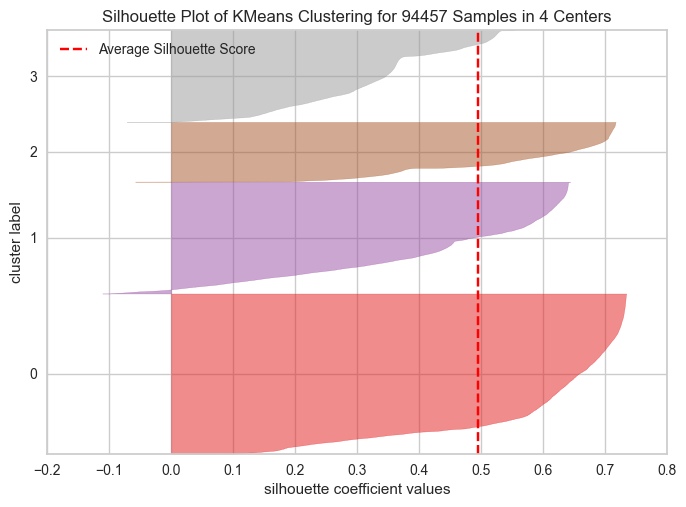

Indice de Davies-Bouldin : 0.7503723093746072 
Indice de silhouette : 0.49559800879926463


In [34]:
X_scaled = preprocessor.fit_transform(df)
X_scaled = pd.DataFrame(X_scaled, index=df.index, columns=df.columns)

kmeans_instance = KMeans(K, n_init=10, random_state=0)
kmeans_instance.fit(df_pca)

silhouette_visualizer = SilhouetteVisualizer(kmeans_instance)
silhouette_visualizer.fit(df_pca)
silhouette_visualizer.show()

pca_kmeans_labels = kmeans_instance.labels_
db = davies_bouldin_score(df_pca, pca_kmeans_labels)
sil = silhouette_score(df_pca, pca_kmeans_labels)
print(f"Indice de Davies-Bouldin : {db} \nIndice de silhouette : {sil}")

cluster_data = {}
for label in set(pca_kmeans_labels):
    cluster_data[label] = df[pca_kmeans_labels == label]

X_scaled["kmeans_label_pca"] = pca_kmeans_labels
df_pca["kmeans_label_pca"] = pca_kmeans_labels
X_scaled_clusters_pca = X_scaled.groupby("kmeans_label_pca").mean()
X_scaled_clusters_pca.iloc[:, :-1]
plot_radars(data=X_scaled_clusters_pca, group="kmeans_label_pca")

Text(0.5, 1.0, 'Clustering PCA')

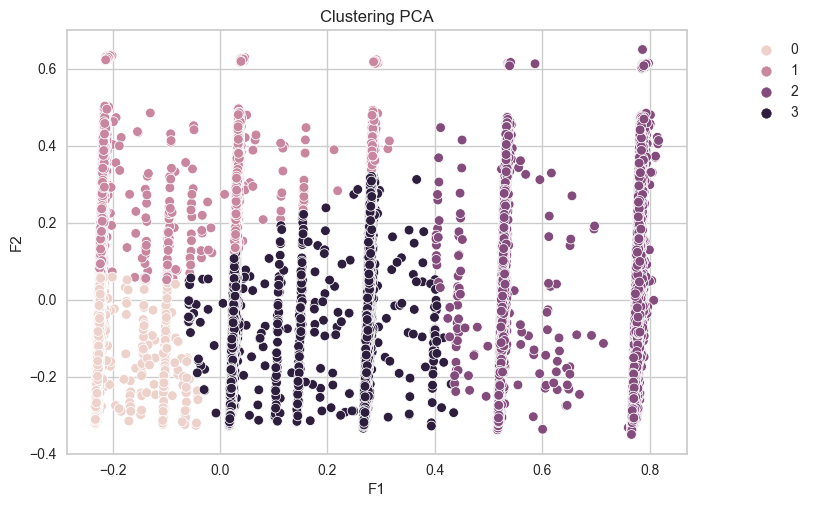

In [35]:
ax = sns.scatterplot(data=df_pca, x="F1", y="F2", hue="kmeans_label_pca")
ax.legend(loc="upper right", bbox_to_anchor=(1.2, 1))
plt.title("Clustering PCA")

In [36]:
print_mean(cluster_data)

Cluster n°0 - Nombres d'individus :35741
Moyenne des features: 
recency                 145.101928
frequency                 1.037576
monetary_value        20243.882029
mean_review_score         4.996779
mean_delivery_time       10.010707
total_items               1.059428
freight_ratio             0.300450
dtype: float64
------------------------------
Cluster n°1 - Nombres d'individus :24941
Moyenne des features: 
recency                 428.355078
frequency                 1.028988
monetary_value        20753.021105
mean_review_score         4.731443
mean_delivery_time       10.855079
total_items               1.054569
freight_ratio             0.302360
dtype: float64
------------------------------
Cluster n°2 - Nombres d'individus :13338
Moyenne des features: 
recency                 247.482531
frequency                 1.022942
monetary_value        33188.214850
mean_review_score         1.229687
mean_delivery_time       17.514907
total_items               1.114035
freight_ratio   

### T-SNE

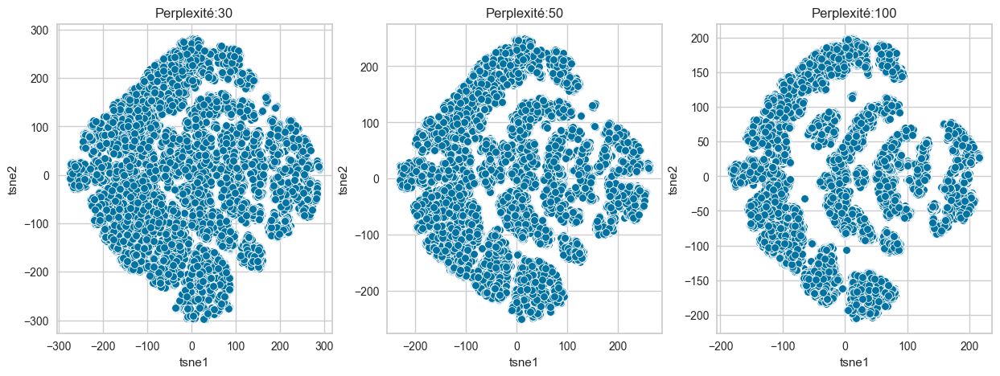

In [37]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# perplexité 30
tsne_pipeline = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("TSNE", TSNE(n_components=2, perplexity=30, n_iter=5000, random_state=0)),
    ]
)
tsne_scale_results = tsne_pipeline.fit_transform(df)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=["tsne1", "tsne2"])
sns.scatterplot(ax=axes[0], data=tsne_df_scale, x="tsne1", y="tsne2")
axes[0].set_title("Perplexité:30")

# perplexité 50
tsne_pipeline = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("TSNE", TSNE(n_components=2, perplexity=50, n_iter=5000, random_state=0)),
    ]
)
tsne_scale_results = tsne_pipeline.fit_transform(df)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=["tsne1", "tsne2"])
sns.scatterplot(ax=axes[1], data=tsne_df_scale, x="tsne1", y="tsne2")
axes[1].set_title("Perplexité:50")

# perplexité 100
tsne_pipeline = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("TSNE", TSNE(n_components=2, perplexity=100, n_iter=5000, random_state=0)),
    ]
)
tsne_scale_results = tsne_pipeline.fit_transform(df)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=["tsne1", "tsne2"])
sns.scatterplot(ax=axes[2], data=tsne_df_scale, x="tsne1", y="tsne2")
axes[2].set_title("Perplexité:100")

plt.show()

Nous allons opter pour une perplexité de 100 car les données ont l'air d'être mieux segmentées.

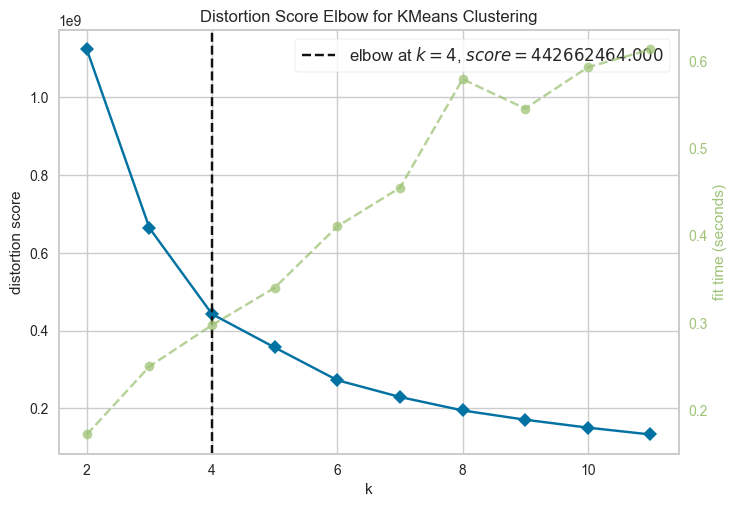

In [38]:
kmeans_visualizer = KElbowVisualizer(KMeans(n_init=10, random_state=0), k=(2, 12))
kmeans_visualizer.fit(tsne_df_scale)
kmeans_visualizer.show()
K = kmeans_visualizer.elbow_value_

In [39]:
%%time
kmeans_model = KMeans(K, n_init=10, random_state=0)
kmeans_model.fit(tsne_df_scale)
db = davies_bouldin_score(tsne_df_scale, kmeans_model.labels_)
sil = silhouette_score(tsne_df_scale, kmeans_model.labels_)
print(f"Indice de Davies-Bouldin : {db} \nIndice de silhouette : {sil}")
tsne_kmeans_labels = kmeans_model.labels_
tsne_df_scale["kmeans_label"] = tsne_kmeans_labels

cluster_data = {}
for label in set(tsne_kmeans_labels):
    cluster_data[label] = df[tsne_kmeans_labels == label]
print_mean(cluster_data)

Indice de Davies-Bouldin : 0.7819371148370412 
Indice de silhouette : 0.4202616214752197
Cluster n°0 - Nombres d'individus :21829
Moyenne des features: 
recency                  76.837601
frequency                 1.004535
monetary_value        19374.150086
mean_review_score         4.660010
mean_delivery_time        9.013839
total_items               1.000183
freight_ratio             0.311857
dtype: float64
------------------------------
Cluster n°1 - Nombres d'individus :26161
Moyenne des features: 
recency                 405.970223
frequency                 1.069149
monetary_value        23026.311652
mean_review_score         4.735234
mean_delivery_time       10.704356
total_items               1.123084
freight_ratio             0.299305
dtype: float64
------------------------------
Cluster n°2 - Nombres d'individus :24479
Moyenne des features: 
recency                 214.963806
frequency                 1.005637
monetary_value        17699.189806
mean_review_score         4.8562

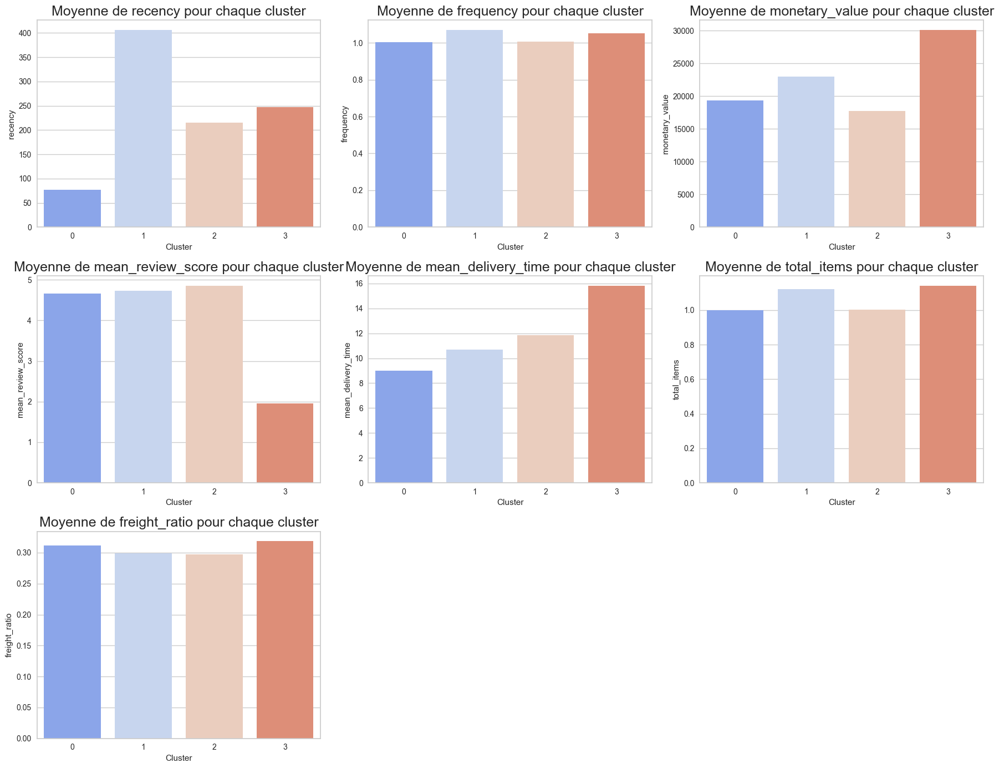

In [40]:
n_features = len(df.columns)
nrows = int(np.ceil(n_features / 3))
ncols = 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 14))

for i, column in enumerate(df.columns):
    try:
        title = "Moyenne de " + str(column) + " pour chaque cluster"
        data = [cluster_data[label][column].mean() for label in cluster_data.keys()]
        sns.barplot(x=list(cluster_data.keys()), y=data, ax=axs[i // 3, i % 3], palette="coolwarm")
        axs[i // 3, i % 3].set_title(title, fontsize=18)
        axs[i // 3, i % 3].set_xlabel("Cluster")
        axs[i // 3, i % 3].set_ylabel(column)
    except Exception as e:
        print(f"Erreur pour la colonne '{column}': {e}")

# Remove empty subplots
for i in range(n_features, nrows * ncols):
    fig.delaxes(axs[i // 3, i % 3])

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Représentation T-SNE de la séparation du jeu de données via KMeans (4 clusters)')

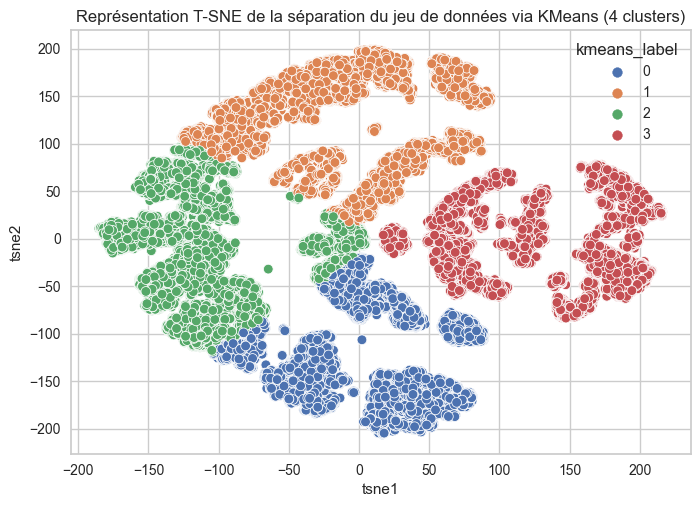

In [41]:
sns.scatterplot(
    data=tsne_df_scale, x="tsne1", y="tsne2", hue="kmeans_label", palette="deep"
)
plt.title(
    "Représentation T-SNE de la séparation du jeu de données via KMeans (4 clusters)"
)

In [42]:
X_scaled.drop("kmeans_label_pca", axis=1, inplace=True)
X_scaled["tsne_kmeans_labels"] = tsne_kmeans_labels
X_scaled_clusters_tsne = X_scaled.groupby("tsne_kmeans_labels").mean()

In [43]:
plot_radars(data=X_scaled_clusters_tsne, group="tsne_kmeans_labels")

In [44]:
tsne_df_scale = tsne_df_scale.drop("kmeans_label", axis=1)

C:\Users\aurel\anaconda3\envs\env_P5\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



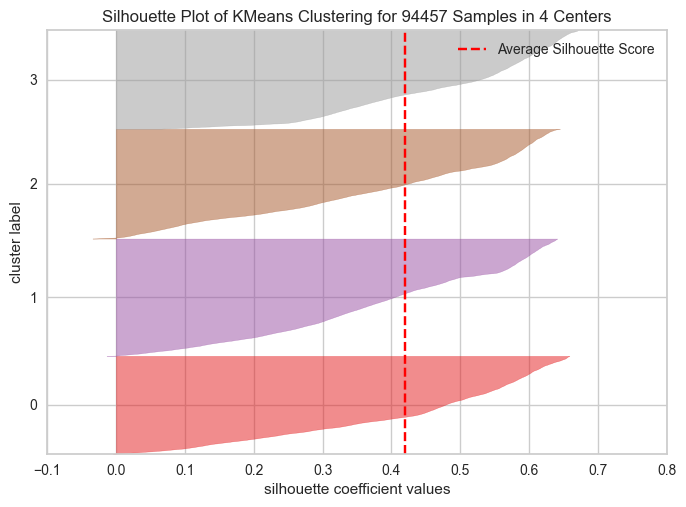

C:\Users\aurel\anaconda3\envs\env_P5\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names

C:\Users\aurel\anaconda3\envs\env_P5\Lib\site-packages\sklearn\manifold\_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



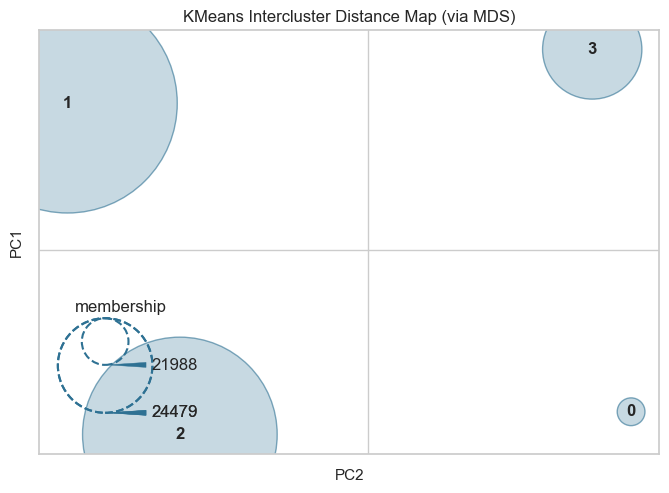

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [45]:
silhouette_visualizer = SilhouetteVisualizer(kmeans_model)
silhouette_visualizer.fit(tsne_df_scale)
silhouette_visualizer.show()

distance_visualizer = InterclusterDistance(kmeans_model)
distance_visualizer.fit(tsne_df_scale)
distance_visualizer.show()

In [46]:
# perplexité 100
tsne_pipeline = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("TSNE", TSNE(n_components=2, perplexity=100, n_iter=5000, random_state=0)),
    ]
)
tsne_scale_results = tsne_pipeline.fit_transform(df)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=["tsne1", "tsne2"])

In [47]:
stop

NameError: name 'stop' is not defined

On remarque que le cluster 1 et le cluster 3 comportent les clients qui sont le plus actif.  
En effet, le cluster 1 regroupe les clients ayant achetés pour un montant élevé et ayant des délais de livraisons relativement longs tandis que le cluster 3 regroupe les clients qui ont achetés fréquemment, plusieurs produits et ont laissés de bonnes reviews sur leurs achats.  
Enfin, le cluster 0 regroupe les clients ayant achetés récemment et le cluster 2 regroupe les clients ayant achetés non récemment.  
Les clients à privilégier sont donc les clients appartenant au cluster 1 et au cluster 3.

### DBScan

In [ ]:
dbs = DBSCAN(eps=3, min_samples=150).fit(tsne_df_scale)

In [ ]:
pd.DataFrame(dbs.labels_).value_counts()

In [ ]:
plt.figure(figsize=(8, 8))
plt.title(
    "Représentation T-SNE de la séparation du jeu de données via DBScan (6 clusters)"
)
sns.scatterplot(data=tsne_df_scale, x="tsne1", y="tsne2", hue=dbs.labels_)

### Regroupement Hiérarchique

In [ ]:
sub_sample = tsne_df_scale.sample(n=50_000, random_state=0)

In [ ]:
%%time
cah = AgglomerativeClustering(n_clusters=K).fit(sub_sample)

**Quasiment autant de temps qu'avec KMeans pour fit seulement la moitié des échantillons**

In [ ]:
data = pd.DataFrame(cah.labels_).value_counts()

In [ ]:
sns.scatterplot(
    x=sub_sample.iloc[:, 0], y=sub_sample.iloc[:, 1], hue=cah.labels_, palette="deep"
)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.title("Agglomerative Clustering Results- Sample of 50_000 clients")
plt.show()

Le clustering hiérarchique est un algorithme intensif en mémoire, car il construit et stocke la matrice de distances entre toutes les paires de points de données avant de fusionner les clusters. Pour un jeu de données de 90000 points, cela représente 90000 x 89999/2 = 4,05 milliards de distances à calculer et à stocker, ce qui nécessite une quantité importante de mémoire.

In [ ]:
df.to_pickle("final_data.pkl")